# 甲状腺組織画像の識別に関する研究
## 画像識別プログラム

## ライブラリ読み込み，ランダムシード固定

In [65]:
import random
import itertools

import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split, Subset
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torchvision.models import resnet50
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

%matplotlib inline

torch.manual_seed(1234)
np.random.seed(1234)
random.seed(1234)

### subsetにtransformを適用するためのクラス
### （subsetを直接transformすることはできない）

In [66]:
class DatasetFromSubset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
        
    def __len__(self):
        return len(self.subset)
    
    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y

### datasetを訓練用と検証用に分割する関数

In [67]:
def make_datasets(dataset, train_indices, val_indices,
                  train_trans=None, val_trans=None):
    train_subset = Subset(dataset, train_indices)
    val_subset = Subset(dataset, val_indices)
    train_dataset = DatasetFromSubset(train_subset, train_trans)
    val_dataset = DatasetFromSubset(val_subset, val_trans)
    
    return train_dataset, val_dataset

### size, mean, stdはImageNetで学習したネットワーク使用時に必要な変換処理

In [68]:
size = 224
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

transformer = {
    "train": transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.RandomRotation(degrees=180),
        transforms.RandomResizedCrop(size, scale=(0.5, 1.0)),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)]),
    "val": transforms.Compose([
        transforms.Resize((size, size)),
        # transforms.CenterCrop(size),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)])}

In [69]:
data_path = "./data/"
dataset = ImageFolder(data_path + "train")
print(dataset.class_to_idx)

{'normal': 0, 'ptc_he': 1, 'unknown': 2}


### ネットワークの初期化をする関数

In [70]:
def init_net():
    net = resnet50(pretrained=True)
    for p in net.parameters():
        p.requires_grad = False
    
    fc_input_dim = net.fc.in_features
    net.fc = nn.Linear(fc_input_dim, 3)
    
    return net

### ネットワークの検証と訓練を実行する関数

In [71]:
def eval_net(net, loader, device="cpu"):
    net.eval()
    ys = []
    ypreds = []
    
    for x, y in loader:
        x = x.to(device)
        y = y.to(device)
        with torch.no_grad():
            ypred = net(x).argmax(1)
        ys.append(y)
        ypreds.append(ypred)
    ys = torch.cat(ys)
    ypreds = torch.cat(ypreds)
    
    return ys, ypreds

train_losses = []
train_acc = []
val_acc = []

def train_net(net, train_loader, test_loader, optimizer_cls=optim.Adam,
              loss_fn=nn.CrossEntropyLoss(), epochs=10, only_fc=True, device="cpu"):
    
    net = net.to(device)
    
    if only_fc:
        optimizer = optimizer_cls(net.fc.parameters())
    else:
        optimizer = optimizer_cls(net.parameters())
    '''
    optimizer = optim.Adam([
        #{"params": params_to_update_1, "lr": 1e-4},
        #{"params": params_to_update_2, "lr": 5e-4},
        {"params": params_to_update_3, "lr": 1e-3}
    ])
    '''
    for epoch in range(epochs):
        net.train()
        running_loss = 0.0
        n_acc = 0.0
        n = 0
        
        for i, (x, y) in tqdm(enumerate(train_loader),
                              total=len(train_loader)):
            x = x.to(device)
            y = y.to(device)
            h = net(x)
            loss = loss_fn(h, y)
            net.zero_grad()
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            ypred = h.argmax(1)
            n_acc += (y == ypred).float().sum().item()
            n += len(x)
            
        train_losses.append(running_loss / i+1)
        train_acc.append(n_acc / n)
        val_ys, val_ypreds = eval_net(net, test_loader, device=device)
        val_acc.append(((val_ys == val_ypreds).float().sum() / len(val_ys)).item())
        print("epoch:{}/{}  train_loss: {:.3f}  train_acc: {:.3f}  val_acc: {:.3f}".format(
        epoch+1, epochs, train_losses[-1], train_acc[-1], val_acc[-1]), flush=True)

In [72]:
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

ys = []
ypreds = []
val_indices_after_skf = []
batch_size = 128
num_workers = 8
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("使用デバイス：", device)

for cv_num, (train_indices, val_indices) in enumerate(skf.split(
    dataset, dataset.targets)):
    
    print("交差検証：{}/{}".format(cv_num+1, skf.get_n_splits()))
    
    train_dataset, val_dataset = make_datasets(
        dataset,
        train_indices,
        val_indices,
        train_trans=transformer["train"],
        val_trans=transformer["val"])

    train_loader = DataLoader(train_dataset, batch_size=batch_size,
                              shuffle=True, num_workers=num_workers)
    val_loader = DataLoader(val_dataset, batch_size=batch_size,
                            shuffle=False, num_workers=num_workers)
    
    net = init_net()
    
    train_net(net, train_loader, val_loader, epochs=30, device=device)
    ys_ypreds = eval_net(net, val_loader, device=device)
    ys.append(ys_ypreds[0])
    ypreds.append(ys_ypreds[1])
    val_indices_after_skf.append(val_indices)
    
ys = torch.cat(ys).cpu().numpy()
ypreds = torch.cat(ypreds).cpu().numpy()
val_indices_after_skf = list(itertools.chain.from_iterable(val_indices_after_skf))

使用デバイス： cuda:0
交差検証：1/10


100%|██████████| 37/37 [00:15<00:00,  2.44it/s]


epoch:1/30  train_loss: 1.477  train_acc: 0.848  val_acc: 0.920


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:2/30  train_loss: 1.281  train_acc: 0.916  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:3/30  train_loss: 1.254  train_acc: 0.919  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:4/30  train_loss: 1.217  train_acc: 0.934  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:5/30  train_loss: 1.209  train_acc: 0.931  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.35it/s]


epoch:6/30  train_loss: 1.210  train_acc: 0.937  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:7/30  train_loss: 1.192  train_acc: 0.942  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:8/30  train_loss: 1.188  train_acc: 0.937  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.34it/s]


epoch:9/30  train_loss: 1.193  train_acc: 0.932  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.37it/s]


epoch:10/30  train_loss: 1.191  train_acc: 0.937  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.36it/s]


epoch:11/30  train_loss: 1.175  train_acc: 0.942  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.36it/s]


epoch:12/30  train_loss: 1.182  train_acc: 0.941  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:13/30  train_loss: 1.178  train_acc: 0.942  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:14/30  train_loss: 1.174  train_acc: 0.941  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:15/30  train_loss: 1.179  train_acc: 0.940  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:16/30  train_loss: 1.163  train_acc: 0.944  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.37it/s]


epoch:17/30  train_loss: 1.177  train_acc: 0.937  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.36it/s]


epoch:18/30  train_loss: 1.169  train_acc: 0.946  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.37it/s]


epoch:19/30  train_loss: 1.161  train_acc: 0.944  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.36it/s]


epoch:20/30  train_loss: 1.171  train_acc: 0.940  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.35it/s]


epoch:21/30  train_loss: 1.168  train_acc: 0.942  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.31it/s]


epoch:22/30  train_loss: 1.172  train_acc: 0.941  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:23/30  train_loss: 1.163  train_acc: 0.946  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:24/30  train_loss: 1.167  train_acc: 0.942  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:25/30  train_loss: 1.159  train_acc: 0.947  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.35it/s]


epoch:26/30  train_loss: 1.162  train_acc: 0.944  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.37it/s]


epoch:27/30  train_loss: 1.169  train_acc: 0.937  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:28/30  train_loss: 1.189  train_acc: 0.933  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.36it/s]


epoch:29/30  train_loss: 1.168  train_acc: 0.944  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:30/30  train_loss: 1.152  train_acc: 0.950  val_acc: 0.942
交差検証：2/10


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:1/30  train_loss: 1.557  train_acc: 0.819  val_acc: 0.889


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:2/30  train_loss: 1.316  train_acc: 0.910  val_acc: 0.911


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:3/30  train_loss: 1.264  train_acc: 0.922  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:4/30  train_loss: 1.245  train_acc: 0.924  val_acc: 0.922


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:5/30  train_loss: 1.227  train_acc: 0.927  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:6/30  train_loss: 1.211  train_acc: 0.931  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:7/30  train_loss: 1.209  train_acc: 0.935  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:8/30  train_loss: 1.208  train_acc: 0.933  val_acc: 0.918


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:9/30  train_loss: 1.199  train_acc: 0.934  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:10/30  train_loss: 1.186  train_acc: 0.940  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.36it/s]


epoch:11/30  train_loss: 1.185  train_acc: 0.944  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.37it/s]


epoch:12/30  train_loss: 1.183  train_acc: 0.940  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:13/30  train_loss: 1.174  train_acc: 0.942  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:14/30  train_loss: 1.177  train_acc: 0.939  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:15/30  train_loss: 1.180  train_acc: 0.938  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.33it/s]


epoch:16/30  train_loss: 1.176  train_acc: 0.944  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.33it/s]


epoch:17/30  train_loss: 1.193  train_acc: 0.939  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:18/30  train_loss: 1.164  train_acc: 0.945  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:19/30  train_loss: 1.170  train_acc: 0.943  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.35it/s]


epoch:20/30  train_loss: 1.173  train_acc: 0.942  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:21/30  train_loss: 1.179  train_acc: 0.943  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.37it/s]


epoch:22/30  train_loss: 1.175  train_acc: 0.937  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.34it/s]


epoch:23/30  train_loss: 1.164  train_acc: 0.946  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:24/30  train_loss: 1.158  train_acc: 0.947  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:25/30  train_loss: 1.171  train_acc: 0.940  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.37it/s]


epoch:26/30  train_loss: 1.156  train_acc: 0.947  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:27/30  train_loss: 1.191  train_acc: 0.940  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:28/30  train_loss: 1.178  train_acc: 0.944  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:29/30  train_loss: 1.164  train_acc: 0.947  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:30/30  train_loss: 1.163  train_acc: 0.940  val_acc: 0.928
交差検証：3/10


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:1/30  train_loss: 1.561  train_acc: 0.820  val_acc: 0.887


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:2/30  train_loss: 1.312  train_acc: 0.905  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:3/30  train_loss: 1.267  train_acc: 0.919  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:4/30  train_loss: 1.236  train_acc: 0.926  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:5/30  train_loss: 1.230  train_acc: 0.924  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:6/30  train_loss: 1.213  train_acc: 0.930  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:7/30  train_loss: 1.208  train_acc: 0.934  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:8/30  train_loss: 1.194  train_acc: 0.935  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:9/30  train_loss: 1.192  train_acc: 0.938  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:10/30  train_loss: 1.192  train_acc: 0.938  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:11/30  train_loss: 1.187  train_acc: 0.937  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:12/30  train_loss: 1.184  train_acc: 0.939  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:13/30  train_loss: 1.176  train_acc: 0.941  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:14/30  train_loss: 1.182  train_acc: 0.938  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:15/30  train_loss: 1.168  train_acc: 0.944  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:16/30  train_loss: 1.172  train_acc: 0.946  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:17/30  train_loss: 1.169  train_acc: 0.943  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:18/30  train_loss: 1.184  train_acc: 0.940  val_acc: 0.950


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:19/30  train_loss: 1.174  train_acc: 0.945  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:20/30  train_loss: 1.169  train_acc: 0.938  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:21/30  train_loss: 1.171  train_acc: 0.945  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:22/30  train_loss: 1.170  train_acc: 0.943  val_acc: 0.950


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:23/30  train_loss: 1.165  train_acc: 0.941  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:24/30  train_loss: 1.170  train_acc: 0.943  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:25/30  train_loss: 1.165  train_acc: 0.941  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:26/30  train_loss: 1.168  train_acc: 0.938  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:27/30  train_loss: 1.170  train_acc: 0.940  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.44it/s]


epoch:28/30  train_loss: 1.165  train_acc: 0.944  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:29/30  train_loss: 1.159  train_acc: 0.943  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:30/30  train_loss: 1.164  train_acc: 0.944  val_acc: 0.946
交差検証：4/10


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:1/30  train_loss: 1.570  train_acc: 0.810  val_acc: 0.911


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:2/30  train_loss: 1.319  train_acc: 0.903  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:3/30  train_loss: 1.269  train_acc: 0.919  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:4/30  train_loss: 1.250  train_acc: 0.920  val_acc: 0.926


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:5/30  train_loss: 1.223  train_acc: 0.930  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:6/30  train_loss: 1.215  train_acc: 0.933  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:7/30  train_loss: 1.208  train_acc: 0.938  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:8/30  train_loss: 1.204  train_acc: 0.934  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:9/30  train_loss: 1.197  train_acc: 0.936  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:10/30  train_loss: 1.192  train_acc: 0.935  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:11/30  train_loss: 1.190  train_acc: 0.938  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:12/30  train_loss: 1.206  train_acc: 0.932  val_acc: 0.953


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:13/30  train_loss: 1.179  train_acc: 0.939  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:14/30  train_loss: 1.186  train_acc: 0.940  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:15/30  train_loss: 1.184  train_acc: 0.942  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:16/30  train_loss: 1.178  train_acc: 0.941  val_acc: 0.950


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:17/30  train_loss: 1.177  train_acc: 0.941  val_acc: 0.950


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:18/30  train_loss: 1.178  train_acc: 0.943  val_acc: 0.953


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:19/30  train_loss: 1.192  train_acc: 0.932  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:20/30  train_loss: 1.178  train_acc: 0.939  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:21/30  train_loss: 1.164  train_acc: 0.945  val_acc: 0.961


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:22/30  train_loss: 1.170  train_acc: 0.942  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:23/30  train_loss: 1.161  train_acc: 0.945  val_acc: 0.957


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:24/30  train_loss: 1.170  train_acc: 0.944  val_acc: 0.953


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:25/30  train_loss: 1.167  train_acc: 0.943  val_acc: 0.963


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:26/30  train_loss: 1.166  train_acc: 0.942  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:27/30  train_loss: 1.164  train_acc: 0.943  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:28/30  train_loss: 1.154  train_acc: 0.946  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:29/30  train_loss: 1.173  train_acc: 0.940  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:30/30  train_loss: 1.164  train_acc: 0.944  val_acc: 0.944
交差検証：5/10


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:1/30  train_loss: 1.538  train_acc: 0.830  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:2/30  train_loss: 1.317  train_acc: 0.907  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:3/30  train_loss: 1.262  train_acc: 0.918  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:4/30  train_loss: 1.243  train_acc: 0.922  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:5/30  train_loss: 1.226  train_acc: 0.927  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:6/30  train_loss: 1.218  train_acc: 0.934  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:7/30  train_loss: 1.207  train_acc: 0.937  val_acc: 0.955


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:8/30  train_loss: 1.205  train_acc: 0.936  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:9/30  train_loss: 1.194  train_acc: 0.937  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:10/30  train_loss: 1.194  train_acc: 0.938  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:11/30  train_loss: 1.179  train_acc: 0.937  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:12/30  train_loss: 1.183  train_acc: 0.937  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:13/30  train_loss: 1.183  train_acc: 0.940  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:14/30  train_loss: 1.177  train_acc: 0.941  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:15/30  train_loss: 1.171  train_acc: 0.945  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:16/30  train_loss: 1.174  train_acc: 0.942  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:17/30  train_loss: 1.169  train_acc: 0.942  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:18/30  train_loss: 1.159  train_acc: 0.949  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:19/30  train_loss: 1.171  train_acc: 0.941  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:20/30  train_loss: 1.167  train_acc: 0.942  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:21/30  train_loss: 1.166  train_acc: 0.941  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:22/30  train_loss: 1.177  train_acc: 0.940  val_acc: 0.950


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:23/30  train_loss: 1.190  train_acc: 0.940  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:24/30  train_loss: 1.173  train_acc: 0.941  val_acc: 0.948


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:25/30  train_loss: 1.169  train_acc: 0.945  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:26/30  train_loss: 1.179  train_acc: 0.943  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:27/30  train_loss: 1.169  train_acc: 0.940  val_acc: 0.951


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:28/30  train_loss: 1.166  train_acc: 0.944  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:29/30  train_loss: 1.170  train_acc: 0.943  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:30/30  train_loss: 1.176  train_acc: 0.939  val_acc: 0.955
交差検証：6/10


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:1/30  train_loss: 1.563  train_acc: 0.821  val_acc: 0.907


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:2/30  train_loss: 1.322  train_acc: 0.903  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:3/30  train_loss: 1.259  train_acc: 0.920  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:4/30  train_loss: 1.238  train_acc: 0.927  val_acc: 0.926


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:5/30  train_loss: 1.221  train_acc: 0.928  val_acc: 0.922


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:6/30  train_loss: 1.208  train_acc: 0.933  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:7/30  train_loss: 1.210  train_acc: 0.937  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:8/30  train_loss: 1.203  train_acc: 0.936  val_acc: 0.920


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:9/30  train_loss: 1.194  train_acc: 0.937  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:10/30  train_loss: 1.189  train_acc: 0.940  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:11/30  train_loss: 1.181  train_acc: 0.939  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:12/30  train_loss: 1.168  train_acc: 0.948  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:13/30  train_loss: 1.187  train_acc: 0.940  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:14/30  train_loss: 1.196  train_acc: 0.931  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:15/30  train_loss: 1.180  train_acc: 0.942  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:16/30  train_loss: 1.177  train_acc: 0.940  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:17/30  train_loss: 1.169  train_acc: 0.944  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:18/30  train_loss: 1.169  train_acc: 0.945  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:19/30  train_loss: 1.181  train_acc: 0.938  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:20/30  train_loss: 1.191  train_acc: 0.935  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:21/30  train_loss: 1.195  train_acc: 0.937  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:22/30  train_loss: 1.156  train_acc: 0.945  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:23/30  train_loss: 1.160  train_acc: 0.947  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:24/30  train_loss: 1.161  train_acc: 0.945  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:25/30  train_loss: 1.158  train_acc: 0.949  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:26/30  train_loss: 1.154  train_acc: 0.945  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:27/30  train_loss: 1.169  train_acc: 0.944  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:28/30  train_loss: 1.163  train_acc: 0.945  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:29/30  train_loss: 1.164  train_acc: 0.940  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:30/30  train_loss: 1.163  train_acc: 0.946  val_acc: 0.934
交差検証：7/10


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:1/30  train_loss: 1.572  train_acc: 0.821  val_acc: 0.883


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:2/30  train_loss: 1.311  train_acc: 0.905  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:3/30  train_loss: 1.266  train_acc: 0.915  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:4/30  train_loss: 1.253  train_acc: 0.922  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:5/30  train_loss: 1.221  train_acc: 0.927  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:6/30  train_loss: 1.212  train_acc: 0.932  val_acc: 0.949


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:7/30  train_loss: 1.217  train_acc: 0.932  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:8/30  train_loss: 1.203  train_acc: 0.932  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:9/30  train_loss: 1.209  train_acc: 0.935  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:10/30  train_loss: 1.193  train_acc: 0.935  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:11/30  train_loss: 1.186  train_acc: 0.938  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:12/30  train_loss: 1.182  train_acc: 0.939  val_acc: 0.949


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:13/30  train_loss: 1.178  train_acc: 0.942  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:14/30  train_loss: 1.180  train_acc: 0.938  val_acc: 0.951


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:15/30  train_loss: 1.180  train_acc: 0.940  val_acc: 0.951


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:16/30  train_loss: 1.179  train_acc: 0.939  val_acc: 0.947


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:17/30  train_loss: 1.176  train_acc: 0.944  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:18/30  train_loss: 1.201  train_acc: 0.933  val_acc: 0.947


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:19/30  train_loss: 1.190  train_acc: 0.934  val_acc: 0.947


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:20/30  train_loss: 1.174  train_acc: 0.940  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:21/30  train_loss: 1.163  train_acc: 0.940  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.38it/s]


epoch:22/30  train_loss: 1.174  train_acc: 0.943  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:23/30  train_loss: 1.178  train_acc: 0.939  val_acc: 0.953


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:24/30  train_loss: 1.170  train_acc: 0.941  val_acc: 0.951


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:25/30  train_loss: 1.165  train_acc: 0.948  val_acc: 0.953


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:26/30  train_loss: 1.165  train_acc: 0.945  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:27/30  train_loss: 1.178  train_acc: 0.940  val_acc: 0.953


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:28/30  train_loss: 1.152  train_acc: 0.947  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:29/30  train_loss: 1.159  train_acc: 0.943  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:30/30  train_loss: 1.163  train_acc: 0.943  val_acc: 0.951
交差検証：8/10


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:1/30  train_loss: 1.517  train_acc: 0.823  val_acc: 0.911


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:2/30  train_loss: 1.284  train_acc: 0.920  val_acc: 0.922


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:3/30  train_loss: 1.247  train_acc: 0.925  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:4/30  train_loss: 1.227  train_acc: 0.930  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:5/30  train_loss: 1.211  train_acc: 0.933  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:6/30  train_loss: 1.202  train_acc: 0.939  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:7/30  train_loss: 1.201  train_acc: 0.938  val_acc: 0.926


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:8/30  train_loss: 1.191  train_acc: 0.938  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:9/30  train_loss: 1.187  train_acc: 0.938  val_acc: 0.926


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:10/30  train_loss: 1.196  train_acc: 0.935  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:11/30  train_loss: 1.189  train_acc: 0.941  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:12/30  train_loss: 1.178  train_acc: 0.941  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:13/30  train_loss: 1.179  train_acc: 0.936  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:14/30  train_loss: 1.164  train_acc: 0.941  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:15/30  train_loss: 1.167  train_acc: 0.941  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:16/30  train_loss: 1.176  train_acc: 0.944  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:17/30  train_loss: 1.169  train_acc: 0.942  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:18/30  train_loss: 1.172  train_acc: 0.945  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:19/30  train_loss: 1.173  train_acc: 0.941  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:20/30  train_loss: 1.191  train_acc: 0.939  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:21/30  train_loss: 1.171  train_acc: 0.944  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:22/30  train_loss: 1.163  train_acc: 0.945  val_acc: 0.947


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:23/30  train_loss: 1.176  train_acc: 0.940  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:24/30  train_loss: 1.162  train_acc: 0.947  val_acc: 0.944


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:25/30  train_loss: 1.165  train_acc: 0.943  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:26/30  train_loss: 1.156  train_acc: 0.943  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:27/30  train_loss: 1.167  train_acc: 0.942  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:28/30  train_loss: 1.167  train_acc: 0.943  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:29/30  train_loss: 1.174  train_acc: 0.941  val_acc: 0.946


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:30/30  train_loss: 1.159  train_acc: 0.948  val_acc: 0.938
交差検証：9/10


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:1/30  train_loss: 1.609  train_acc: 0.802  val_acc: 0.905


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:2/30  train_loss: 1.327  train_acc: 0.903  val_acc: 0.897


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:3/30  train_loss: 1.278  train_acc: 0.917  val_acc: 0.922


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:4/30  train_loss: 1.239  train_acc: 0.925  val_acc: 0.916


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:5/30  train_loss: 1.222  train_acc: 0.930  val_acc: 0.922


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:6/30  train_loss: 1.216  train_acc: 0.930  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:7/30  train_loss: 1.208  train_acc: 0.933  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:8/30  train_loss: 1.205  train_acc: 0.935  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:9/30  train_loss: 1.193  train_acc: 0.933  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:10/30  train_loss: 1.188  train_acc: 0.937  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:11/30  train_loss: 1.190  train_acc: 0.941  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:12/30  train_loss: 1.179  train_acc: 0.941  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:13/30  train_loss: 1.182  train_acc: 0.941  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:14/30  train_loss: 1.169  train_acc: 0.943  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:15/30  train_loss: 1.165  train_acc: 0.946  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:16/30  train_loss: 1.174  train_acc: 0.941  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:17/30  train_loss: 1.177  train_acc: 0.938  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:18/30  train_loss: 1.176  train_acc: 0.940  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:19/30  train_loss: 1.163  train_acc: 0.948  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:20/30  train_loss: 1.174  train_acc: 0.942  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:21/30  train_loss: 1.158  train_acc: 0.943  val_acc: 0.938


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:22/30  train_loss: 1.160  train_acc: 0.947  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:23/30  train_loss: 1.166  train_acc: 0.940  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:24/30  train_loss: 1.158  train_acc: 0.943  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:25/30  train_loss: 1.157  train_acc: 0.944  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:26/30  train_loss: 1.151  train_acc: 0.948  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:27/30  train_loss: 1.169  train_acc: 0.938  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:28/30  train_loss: 1.153  train_acc: 0.947  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.36it/s]


epoch:29/30  train_loss: 1.169  train_acc: 0.942  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:30/30  train_loss: 1.161  train_acc: 0.944  val_acc: 0.942
交差検証：10/10


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:1/30  train_loss: 1.545  train_acc: 0.823  val_acc: 0.911


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:2/30  train_loss: 1.295  train_acc: 0.910  val_acc: 0.918


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:3/30  train_loss: 1.258  train_acc: 0.921  val_acc: 0.922


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:4/30  train_loss: 1.232  train_acc: 0.928  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.39it/s]


epoch:5/30  train_loss: 1.222  train_acc: 0.928  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:6/30  train_loss: 1.207  train_acc: 0.938  val_acc: 0.922


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:7/30  train_loss: 1.213  train_acc: 0.931  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:8/30  train_loss: 1.196  train_acc: 0.935  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:9/30  train_loss: 1.190  train_acc: 0.940  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:10/30  train_loss: 1.187  train_acc: 0.938  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.43it/s]


epoch:11/30  train_loss: 1.175  train_acc: 0.943  val_acc: 0.924


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:12/30  train_loss: 1.173  train_acc: 0.939  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:13/30  train_loss: 1.191  train_acc: 0.940  val_acc: 0.926


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:14/30  train_loss: 1.171  train_acc: 0.942  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:15/30  train_loss: 1.170  train_acc: 0.941  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:16/30  train_loss: 1.176  train_acc: 0.943  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:17/30  train_loss: 1.173  train_acc: 0.939  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:18/30  train_loss: 1.184  train_acc: 0.940  val_acc: 0.928


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:19/30  train_loss: 1.182  train_acc: 0.945  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:20/30  train_loss: 1.173  train_acc: 0.940  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:21/30  train_loss: 1.165  train_acc: 0.943  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:22/30  train_loss: 1.167  train_acc: 0.944  val_acc: 0.936


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:23/30  train_loss: 1.167  train_acc: 0.942  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.40it/s]


epoch:24/30  train_loss: 1.160  train_acc: 0.946  val_acc: 0.934


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:25/30  train_loss: 1.155  train_acc: 0.947  val_acc: 0.930


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:26/30  train_loss: 1.169  train_acc: 0.940  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:27/30  train_loss: 1.156  train_acc: 0.945  val_acc: 0.932


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:28/30  train_loss: 1.153  train_acc: 0.947  val_acc: 0.942


100%|██████████| 37/37 [00:15<00:00,  2.41it/s]


epoch:29/30  train_loss: 1.165  train_acc: 0.942  val_acc: 0.940


100%|██████████| 37/37 [00:15<00:00,  2.42it/s]


epoch:30/30  train_loss: 1.154  train_acc: 0.949  val_acc: 0.936


In [73]:
print(accuracy_score(ys, ypreds))
print(confusion_matrix(ys, ypreds))
print(classification_report(ys, ypreds,
                            target_names=["normal", "ptc_he", "unknown"]))

0.9414965986394558
[[3520   19    4]
 [  27 1261    4]
 [  79  168   63]]
              precision    recall  f1-score   support

      normal       0.97      0.99      0.98      3543
      ptc_he       0.87      0.98      0.92      1292
     unknown       0.89      0.20      0.33       310

    accuracy                           0.94      5145
   macro avg       0.91      0.72      0.74      5145
weighted avg       0.94      0.94      0.93      5145



### （正解：予測）＝（正常：腫瘍）or（腫瘍：正常）の画像を表示する

In [82]:
def show_wrong_img(dataset, ys, ypreds, indices=None):
    wrong_num = 0
    for i in range(len(ys)):
        if ((ys[i]==0) and (ypreds[i]==1)) or ((ys[i]==1) and (ypreds[i]==0)):
            if indices is not None:
                img = dataset[indices[i]][0]
            else:
                img = dataset[i][0]
            plt.imshow(img)
            plt.title("real:{}  pred:{}".format(ys[i], ypreds[i]))
            plt.show()
            wrong_num += 1
    print(wrong_num)

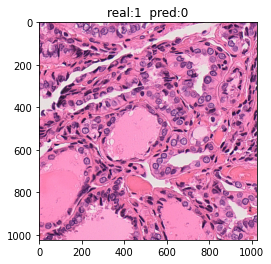

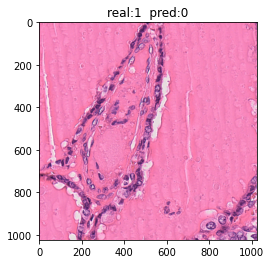

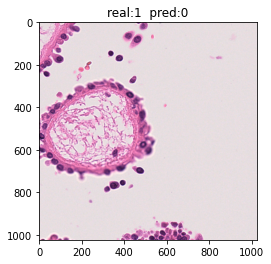

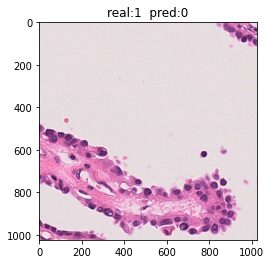

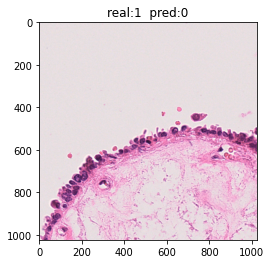

...

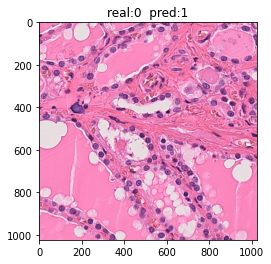

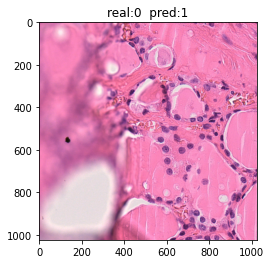

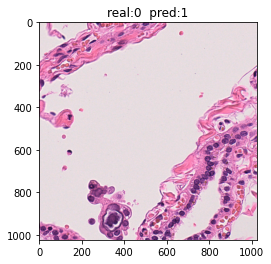

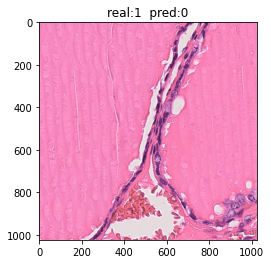

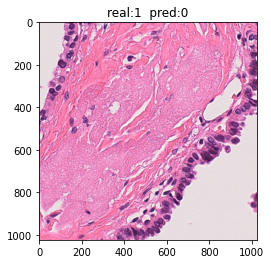

46


In [83]:
show_wrong_img(dataset, ys, ypreds, val_indices_after_skf)

### テスト用データの識別

In [86]:
data_path = "./data/"
train_dataset = ImageFolder(data_path + "train",
                            transform=transformer["train"])
test_dataset = ImageFolder(data_path + "test",
                           transform=transformer["val"])

batch_size = 128
num_workers = 8
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("使用デバイス：", device)

train_loader = DataLoader(train_dataset, batch_size=batch_size,
                          shuffle=True, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size,
                         shuffle=False, num_workers=num_workers)

使用デバイス： cuda:0


In [88]:
net = init_net()
    
train_net(net, train_loader, test_loader, epochs=30, device=device)

100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:1/30  train_loss: 1.543  train_acc: 0.818  val_acc: 0.489


100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


epoch:2/30  train_loss: 1.302  train_acc: 0.912  val_acc: 0.495


100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


epoch:3/30  train_loss: 1.251  train_acc: 0.925  val_acc: 0.505


100%|██████████| 41/41 [00:17<00:00,  2.37it/s]


epoch:4/30  train_loss: 1.229  train_acc: 0.928  val_acc: 0.495


100%|██████████| 41/41 [00:17<00:00,  2.34it/s]


epoch:5/30  train_loss: 1.210  train_acc: 0.934  val_acc: 0.489


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:6/30  train_loss: 1.207  train_acc: 0.933  val_acc: 0.507


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:7/30  train_loss: 1.190  train_acc: 0.937  val_acc: 0.504


100%|██████████| 41/41 [00:17<00:00,  2.34it/s]


epoch:8/30  train_loss: 1.190  train_acc: 0.938  val_acc: 0.497


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:9/30  train_loss: 1.188  train_acc: 0.938  val_acc: 0.510


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:10/30  train_loss: 1.180  train_acc: 0.941  val_acc: 0.494


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:11/30  train_loss: 1.181  train_acc: 0.940  val_acc: 0.495


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:12/30  train_loss: 1.179  train_acc: 0.941  val_acc: 0.495


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:13/30  train_loss: 1.182  train_acc: 0.941  val_acc: 0.482


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:14/30  train_loss: 1.173  train_acc: 0.944  val_acc: 0.489


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:15/30  train_loss: 1.174  train_acc: 0.938  val_acc: 0.496


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:16/30  train_loss: 1.175  train_acc: 0.941  val_acc: 0.465


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:17/30  train_loss: 1.176  train_acc: 0.939  val_acc: 0.507


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:18/30  train_loss: 1.165  train_acc: 0.944  val_acc: 0.475


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:19/30  train_loss: 1.179  train_acc: 0.939  val_acc: 0.513


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:20/30  train_loss: 1.161  train_acc: 0.945  val_acc: 0.498


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:21/30  train_loss: 1.169  train_acc: 0.941  val_acc: 0.494


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:22/30  train_loss: 1.153  train_acc: 0.948  val_acc: 0.499


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:23/30  train_loss: 1.172  train_acc: 0.945  val_acc: 0.510


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:24/30  train_loss: 1.175  train_acc: 0.938  val_acc: 0.494


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:25/30  train_loss: 1.155  train_acc: 0.947  val_acc: 0.510


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:26/30  train_loss: 1.164  train_acc: 0.948  val_acc: 0.523


100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


epoch:27/30  train_loss: 1.157  train_acc: 0.946  val_acc: 0.491


100%|██████████| 41/41 [00:17<00:00,  2.35it/s]


epoch:28/30  train_loss: 1.168  train_acc: 0.942  val_acc: 0.503


100%|██████████| 41/41 [00:17<00:00,  2.31it/s]


epoch:29/30  train_loss: 1.161  train_acc: 0.942  val_acc: 0.490


100%|██████████| 41/41 [00:17<00:00,  2.34it/s]


epoch:30/30  train_loss: 1.157  train_acc: 0.947  val_acc: 0.513


In [89]:
save_path = "./weights_classification_thyroid.pth"
torch.save(net.state_dict(), save_path)

In [90]:
net = init_net()
load_path = "./weights_classification_thyroid.pth"
load_weights = torch.load(load_path)
net.load_state_dict(load_weights)
net = net.to(device)

In [91]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

ys, ypreds = eval_net(net, test_loader, device=device)
ys = ys.cpu().numpy()
ypreds = ypreds.cpu().numpy()
print(train_dataset.class_to_idx)
print(test_dataset.class_to_idx)
print(accuracy_score(ys, ypreds))
print(confusion_matrix(ys, ypreds))
print(classification_report(ys, ypreds,
                            target_names=["normal", "ptc_he", "unknown"]))

{'normal': 0, 'ptc_he': 1, 'unknown': 2}
{'normal': 0, 'ptc_he': 1, 'unknown': 2}
0.5129310344827587
[[179   1   0]
 [ 43 412   0]
 [515   6   4]]
              precision    recall  f1-score   support

      normal       0.24      0.99      0.39       180
      ptc_he       0.98      0.91      0.94       455
     unknown       1.00      0.01      0.02       525

    accuracy                           0.51      1160
   macro avg       0.74      0.64      0.45      1160
weighted avg       0.88      0.51      0.44      1160



### （正解：予測）＝（正常：腫瘍）or（腫瘍：正常）の画像を表示する

{'normal': 0, 'ptc_he': 1, 'unknown': 2}


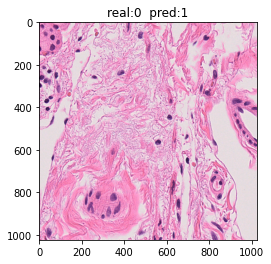

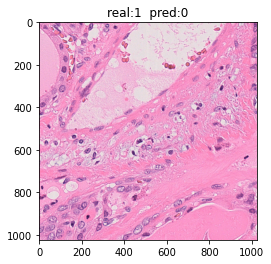

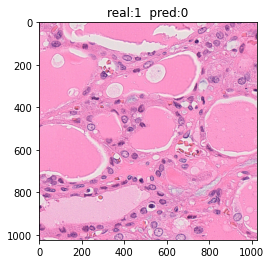

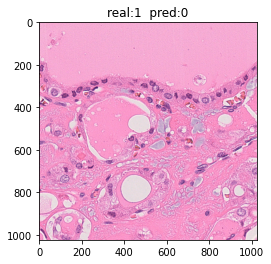

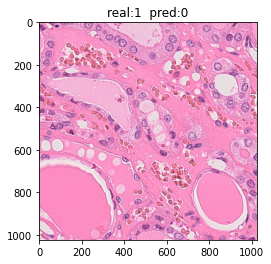

...

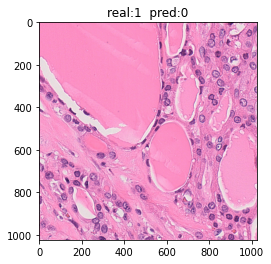

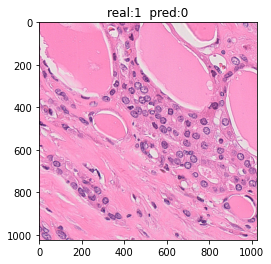

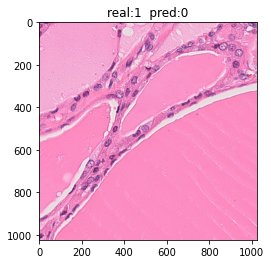

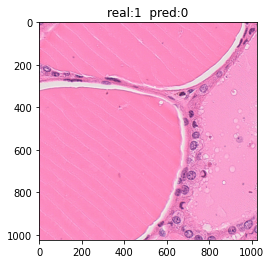

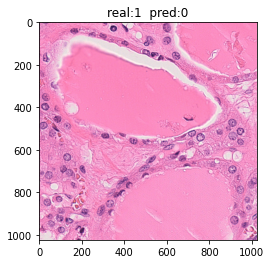

44


In [92]:
# print(len(dataset), len(train_dataset), len(test_dataset))
print(test_dataset.class_to_idx)
test_dataset_not_transform = ImageFolder(data_path + "test")

show_wrong_img(test_dataset_not_transform, ys, ypreds)